# Case Study - Telecom Churn

Build models to predict churn. This predictive model will serve two purposes:

1. It will be used to predict whether a high-value customer will churn or not, in near future (i.e. churn phase). By knowing this, the company can take action steps such as providing special plans, discounts on recharge etc.

2. It will be used to identify important variables that are strong predictors of churn. These variables may also indicate why customers choose to switch to other networks.

 

In some cases, both of the above-stated goals can be achieved by a single machine learning model. But here, you have a large number of attributes, and thus you should try using a dimensionality reduction technique such as PCA and then build a predictive model. After PCA, you can use any classification model.

In [1]:
# Importing all required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# hide warnings
import warnings
warnings.filterwarnings('ignore')

## 1. Data understanding, Exploration and Cleaning

In [2]:
telecomData = pd.read_csv('telecom_churn_data.csv')

In [3]:
pd.set_option('display.max_rows', None)
pd.set_option("display.max_columns", None)

In [4]:
telecomData.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [5]:
telecomData.shape

(99999, 226)

In [6]:
telecomData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [7]:
# display all columns and their data types
print(telecomData.dtypes)

mobile_number                 int64
circle_id                     int64
loc_og_t2o_mou              float64
std_og_t2o_mou              float64
loc_ic_t2o_mou              float64
last_date_of_month_6         object
last_date_of_month_7         object
last_date_of_month_8         object
last_date_of_month_9         object
arpu_6                      float64
arpu_7                      float64
arpu_8                      float64
arpu_9                      float64
onnet_mou_6                 float64
onnet_mou_7                 float64
onnet_mou_8                 float64
onnet_mou_9                 float64
offnet_mou_6                float64
offnet_mou_7                float64
offnet_mou_8                float64
offnet_mou_9                float64
roam_ic_mou_6               float64
roam_ic_mou_7               float64
roam_ic_mou_8               float64
roam_ic_mou_9               float64
roam_og_mou_6               float64
roam_og_mou_7               float64
roam_og_mou_8               

In [8]:
# Convert the data types of columns having date values. Remaining columns looks fine.
date_type_cols = ['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'last_date_of_month_9', \
                 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'date_of_last_rech_9', \
                 'date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8', 'date_of_last_rech_data_9']

In [9]:
# Convert to date time
telecomData[date_type_cols] = telecomData[date_type_cols].apply(pd.to_datetime)

In [10]:
# checking the dataset
print(telecomData.dtypes)

mobile_number                        int64
circle_id                            int64
loc_og_t2o_mou                     float64
std_og_t2o_mou                     float64
loc_ic_t2o_mou                     float64
last_date_of_month_6        datetime64[ns]
last_date_of_month_7        datetime64[ns]
last_date_of_month_8        datetime64[ns]
last_date_of_month_9        datetime64[ns]
arpu_6                             float64
arpu_7                             float64
arpu_8                             float64
arpu_9                             float64
onnet_mou_6                        float64
onnet_mou_7                        float64
onnet_mou_8                        float64
onnet_mou_9                        float64
offnet_mou_6                       float64
offnet_mou_7                       float64
offnet_mou_8                       float64
offnet_mou_9                       float64
roam_ic_mou_6                      float64
roam_ic_mou_7                      float64
roam_ic_mou

In [11]:
telecomData.head(5)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,

#### Missing Value Treatment

In [12]:
perNullValues = pd.DataFrame((telecomData.isnull().sum() *100/len(telecomData)).sort_values(ascending=False))
perNullValues = perNullValues.reset_index()
perNullValues.head(5)

,index,0
0,count_rech_2g_6,74.846748
1,date_of_last_rech_data_6,74.846748
2,count_rech_3g_6,74.846748
3,av_rech_amt_data_6,74.846748
4,max_rech_data_6,74.846748


In [13]:
perNullValues.rename(columns={'index':'Columns', 0:'NullValues'}, inplace=True)
perNullValues.head(2)

,Columns,NullValues
0,count_rech_2g_6,74.846748
1,date_of_last_rech_data_6,74.846748


In [14]:
perNullValues = perNullValues[perNullValues.NullValues > 0]
perNullValues

,Columns,NullValues
0,count_rech_2g_6,74.846748
1,date_of_last_rech_data_6,74.846748
2,count_rech_3g_6,74.846748
3,av_rech_amt_data_6,74.846748
4,max_rech_data_6,74.846748
5,total_rech_data_6,74.846748
6,arpu_3g_6,74.846748
7,arpu_2g_6,74.846748
8,night_pck_user_6,74.846748
9,fb_user_6,74.846748


Above is a list of all columns with the percentage of null values they contain

Several columns have more than 70% of their data missing. We cannot drop them directly unless we utilize the crucial information contained in them, which for us is to find HIGH VALUES CUSTOMERS.

Considering the nature of data and looking at what each column means, we can impute the numeric missing values with Zeroes and continue with the EDA. If we impute the numeric columns with anything except 0, it will be an assumption that data was consumed, or calls were made, or that a customer is an FB user or a night pack user when they are not. The missing values, on the other hand can give us insight of the user stopping to use the services and that is important to consider because it is directly related to churning

In [15]:
numericCols = telecomData.columns[telecomData.dtypes != 'datetime64[ns]']

In [16]:
len(numericCols)

214

In [17]:
datetimeCols = telecomData.columns[telecomData.dtypes == 'datetime64[ns]']
len(datetimeCols)

12

Imputing missing values in numeric columns with 0 because the data is transactional and some columns should not have values in every transaction

In [18]:
#Imputing missing values of null columns with 0
telecomData[numericCols] = telecomData[numericCols].fillna(0)

In [19]:
telecomData[numericCols].isnull().sum()

mobile_number         0
circle_id             0
loc_og_t2o_mou        0
std_og_t2o_mou        0
loc_ic_t2o_mou        0
arpu_6                0
arpu_7                0
arpu_8                0
arpu_9                0
onnet_mou_6           0
onnet_mou_7           0
onnet_mou_8           0
onnet_mou_9           0
offnet_mou_6          0
offnet_mou_7          0
offnet_mou_8          0
offnet_mou_9          0
roam_ic_mou_6         0
roam_ic_mou_7         0
roam_ic_mou_8         0
roam_ic_mou_9         0
roam_og_mou_6         0
roam_og_mou_7         0
roam_og_mou_8         0
roam_og_mou_9         0
loc_og_t2t_mou_6      0
loc_og_t2t_mou_7      0
loc_og_t2t_mou_8      0
loc_og_t2t_mou_9      0
loc_og_t2m_mou_6      0
loc_og_t2m_mou_7      0
loc_og_t2m_mou_8      0
loc_og_t2m_mou_9      0
loc_og_t2f_mou_6      0
loc_og_t2f_mou_7      0
loc_og_t2f_mou_8      0
loc_og_t2f_mou_9      0
loc_og_t2c_mou_6      0
loc_og_t2c_mou_7      0
loc_og_t2c_mou_8      0
loc_og_t2c_mou_9      0
loc_og_mou_6    

Imputing null values in datetime columns

In [20]:
telecomData[datetimeCols].isnull().sum()

last_date_of_month_6            0
last_date_of_month_7          601
last_date_of_month_8         1100
last_date_of_month_9         1659
date_of_last_rech_6          1607
date_of_last_rech_7          1767
date_of_last_rech_8          3622
date_of_last_rech_9          4760
date_of_last_rech_data_6    74846
date_of_last_rech_data_7    74428
date_of_last_rech_data_8    73660
date_of_last_rech_data_9    74077
dtype: int64

In [21]:
#Imputing all last_date_of_month null values by last date of corresponding months
import datetime
tempDate = datetime.datetime(2014,7,31)
print(tempDate)


2014-07-31 00:00:00


In [22]:
telecomData['last_date_of_month_7'].fillna(tempDate, inplace=True)

In [23]:
tempDate = datetime.datetime(2014,8,31)
telecomData['last_date_of_month_8'].fillna(tempDate, inplace=True)

tempDate = datetime.datetime(2014,9,30)
telecomData['last_date_of_month_9'].fillna(tempDate, inplace=True)

In [24]:
telecomData[{'date_of_last_rech_6', 'date_of_last_rech_data_6'}].head(20)

,date_of_last_rech_6,date_of_last_rech_data_6
0,2014-06-21,2014-06-21
1,2014-06-29,NaT
2,2014-06-17,NaT
3,2014-06-28,NaT
4,2014-06-26,2014-06-04
5,2014-06-19,NaT
6,2014-06-28,NaT
7,2014-06-27,NaT
8,2014-06-25,NaT
9,2014-06-29,NaT


We are unable to find a pattern through which we can properly impute the rest of the date columns. Thus leaving them blank.

#### Data exploration

<b> Filter High Value customers </b>
<p>    
Those who have recharged with amount >= X, where X = 70th percentile of average recharge amount in the first two months (6th, 7th month)

In [25]:
telecomData[['total_rech_data_6', 'av_rech_amt_data_6']].head(10)

,total_rech_data_6,av_rech_amt_data_6
0,1.0,252.0
1,0.0,0.0
2,0.0,0.0
3,0.0,0.0
4,1.0,56.0
5,0.0,0.0
6,0.0,0.0
7,0.0,0.0
8,0.0,0.0
9,0.0,0.0


In [26]:
#Verifying that if total recharge data is 0 then average recharge amount
#is also 0, and vice versa, otherwise data would be inconsistent
telecomData[(telecomData.total_rech_data_6 != 0) & (telecomData.av_rech_amt_data_6 == 0)]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g


In [27]:
telecomData[(telecomData.total_rech_data_6 == 0) & (telecomData.av_rech_amt_data_6 != 0)]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g


Data is consistent and now we can make a derived columns telling the total average data-recharge amount for the month

In [28]:
telecomData['total_data_rec_amt_6'] = telecomData.total_rech_data_6 * telecomData.av_rech_amt_data_6

In [29]:
telecomData['total_data_rec_amt_7'] = telecomData.total_rech_data_7 * telecomData.av_rech_amt_data_7
telecomData['total_data_rec_amt_8'] = telecomData.total_rech_data_8 * telecomData.av_rech_amt_data_8
telecomData['total_data_rec_amt_9'] = telecomData.total_rech_data_9 * telecomData.av_rech_amt_data_9

#### Finding average of total recharge amount for months 6th and 7th


In [30]:
# Total recharge amount (calls + data) for months 6, 7, 8, and 9
telecomData['total_call_data_rec_amt_6'] = telecomData['total_data_rec_amt_6'] + telecomData['total_rech_amt_6']
telecomData['total_call_data_rec_amt_7'] = telecomData['total_data_rec_amt_7'] + telecomData['total_rech_amt_7']

In [31]:
#Finding average of recharge amount data of 6th and 7th month for each transaction
avg_recharge_amt_month_6_7 = telecomData[{'total_call_data_rec_amt_6', 'total_call_data_rec_amt_7'}].mean(axis=1)

In [32]:
#Finding 70th percentile of the mean recharge amount for 6th and 7th months
avg_rech_amt_70th = np.percentile(avg_recharge_amt_month_6_7,70)
print('70th percentile of the mean recharge amount for 6th and 7th months = ', avg_rech_amt_70th)

70th percentile of the mean recharge amount for 6th and 7th months =  478.0


In [33]:
high_value_customers = telecomData[avg_recharge_amt_month_6_7 >= avg_rech_amt_70th]

In [34]:
high_value_customers.shape

(30001, 232)

In [35]:
high_value_customers.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rec_amt_6,total_data_rec_amt_7,total_data_rec_amt_8,total_data_rec_amt_9,total_call_data_rec_amt_6,total_call_data_rec_amt_7
0,7000842753,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0

In [36]:
#Resetting the index
high_value_customers.reset_index(drop=True, inplace=True)
high_value_customers.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rec_amt_6,total_data_rec_amt_7,total_data_rec_amt_8,total_data_rec_amt_9,total_call_data_rec_amt_6,total_call_data_rec_amt_7
0,7000842753,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0

#### Tag churners and remove attributes of the churn phase

Churn = 1, else 0. 
Those who have not made any calls (outgoing or incoming) AND have not used mobile internet even once in the churn phase (month 9). Below attributes are used
 - total_ic_mou_9
 - total_og_mou_9
 - vol_2g_mb_9
 - vol_3g_mb_9

In [37]:
high_value_customers[(high_value_customers['total_ic_mou_9'] == 0) \
                     & (high_value_customers['total_og_mou_9'] == 0) \
                     & (high_value_customers['vol_2g_mb_9'] == 0) \
                     & (high_value_customers['vol_3g_mb_9'] == 0.0)].shape

(2441, 232)

In [38]:
high_value_customers['churn'] = high_value_customers.apply(lambda x: 1 if ((x.total_ic_mou_9 == 0) &
                                                                           (x.total_og_mou_9 == 0) &
                                                                           (x.vol_2g_mb_9 == 0) &
                                                                           (x.vol_3g_mb_9 == 0)) else 0, axis=1)

In [39]:
#Verifying if the churn labelling is done correctly by matching the number
# of churn labels with the number of churn customers we found by checking
# the condition
len(high_value_customers[high_value_customers.churn == 1])

2441

#### Renaming columns that have wrong naming format

Below columns contain monthly data but their name doesnt contain the month in terms of a numeral. We need to rename these and suffix the number of the month, for consistency, so that later we can select all columns belonging to a certain month easily

- aug_vbc_3g                         float64
- jul_vbc_3g                         float64
- jun_vbc_3g                         float64
- sep_vbc_3g                         float64

In [40]:
high_value_customers.rename(columns = {'aug_vbc_3g':'vbc_3g_8',
                                       'jul_vbc_3g':'vbc_3g_7',
                                       'jun_vbc_3g':'vbc_3g_6',
                                       'sep_vbc_3g':'vbc_3g_9'}, inplace=True)

#### Dropping all columns of the 9th month

In [41]:
cols_9 = [col_name for col_name in high_value_customers.columns if '_9' in col_name]
cols_9

['last_date_of_month_9',
 'arpu_9',
 'onnet_mou_9',
 'offnet_mou_9',
 'roam_ic_mou_9',
 'roam_og_mou_9',
 'loc_og_t2t_mou_9',
 'loc_og_t2m_mou_9',
 'loc_og_t2f_mou_9',
 'loc_og_t2c_mou_9',
 'loc_og_mou_9',
 'std_og_t2t_mou_9',
 'std_og_t2m_mou_9',
 'std_og_t2f_mou_9',
 'std_og_t2c_mou_9',
 'std_og_mou_9',
 'isd_og_mou_9',
 'spl_og_mou_9',
 'og_others_9',
 'total_og_mou_9',
 'loc_ic_t2t_mou_9',
 'loc_ic_t2m_mou_9',
 'loc_ic_t2f_mou_9',
 'loc_ic_mou_9',
 'std_ic_t2t_mou_9',
 'std_ic_t2m_mou_9',
 'std_ic_t2f_mou_9',
 'std_ic_t2o_mou_9',
 'std_ic_mou_9',
 'total_ic_mou_9',
 'spl_ic_mou_9',
 'isd_ic_mou_9',
 'ic_others_9',
 'total_rech_num_9',
 'total_rech_amt_9',
 'max_rech_amt_9',
 'date_of_last_rech_9',
 'last_day_rch_amt_9',
 'date_of_last_rech_data_9',
 'total_rech_data_9',
 'max_rech_data_9',
 'count_rech_2g_9',
 'count_rech_3g_9',
 'av_rech_amt_data_9',
 'vol_2g_mb_9',
 'vol_3g_mb_9',
 'arpu_3g_9',
 'arpu_2g_9',
 'night_pck_user_9',
 'monthly_2g_9',
 'sachet_2g_9',
 'monthly_3g_9',
 

In [42]:
print('Dropping all columns against the 9th month. Number of columns \
dropped will be = ', len(cols_9))

Dropping all columns against the 9th month. Number of columns dropped will be =  56


In [43]:
high_value_customers.drop(columns=cols_9, inplace=True)
high_value_customers.shape

(30001, 177)

#### PCA will not work if it encounters any column with Zero variance. So checking zero variance column, if any, and dropping those

In [44]:
cols_variance = high_value_customers.var() == 0
print('Total number of columns with zero variance = ', cols_variance.sum())
cols_variance.head(5)

Total number of columns with zero variance =  10


mobile_number     False
circle_id          True
loc_og_t2o_mou     True
std_og_t2o_mou     True
loc_ic_t2o_mou     True
dtype: bool

In [45]:
colsZeroVariance = cols_variance[cols_variance==True].index
print('List of columns with Zero variance - ')
colsZeroVariance

List of columns with Zero variance - 


Index(['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8',
       'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8'],
      dtype='object')

In [46]:
#Verifying the columns we got by checking the same thing other way round
# which would be to check all columns containing same value

cols_unique_vals_status = high_value_customers.nunique() == True
print('Total number of columns with same values = ', cols_unique_vals_status.sum()) 

Total number of columns with same values =  13


In [47]:
colsUniqueVals = cols_unique_vals_status[cols_unique_vals_status==True].index
print('List of columns with same values throughout - ')
colsUniqueVals

List of columns with same values throughout - 


Index(['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8',
       'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8'],
      dtype='object')

Additional Date columns got caught by the second way of recognizing no variance columns. Let us first drop all non date zero variance columns

In [48]:
high_value_customers.drop(columns = colsZeroVariance, inplace=True)
high_value_customers.shape

(30001, 167)

In [49]:
#Dropping individual columns whose total is already available, and was utilized to label Churn
cols = ['loc_og_t2t_mou_6','loc_og_t2m_mou_6','loc_og_t2f_mou_6',
'loc_og_t2c_mou_6','std_og_t2t_mou_6','std_og_t2m_mou_6',
'std_og_t2f_mou_6','loc_ic_t2t_mou_6','loc_ic_t2m_mou_6',
'loc_ic_t2f_mou_6','std_ic_t2t_mou_6','std_ic_t2m_mou_6',
'std_ic_t2f_mou_6','loc_og_t2t_mou_7','loc_og_t2m_mou_7',
'loc_og_t2f_mou_7','loc_og_t2c_mou_7','std_og_t2t_mou_7',
'std_og_t2m_mou_7','std_og_t2f_mou_7','loc_ic_t2t_mou_7',
'loc_ic_t2m_mou_7','loc_ic_t2f_mou_7','std_ic_t2t_mou_7',
'std_ic_t2m_mou_7','std_ic_t2f_mou_7','loc_og_t2t_mou_8',
'loc_og_t2m_mou_8','loc_og_t2f_mou_8','loc_og_t2c_mou_8',
'std_og_t2t_mou_8','std_og_t2m_mou_8','std_og_t2f_mou_8',
'loc_ic_t2t_mou_8','loc_ic_t2m_mou_8','loc_ic_t2f_mou_8',
'std_ic_t2t_mou_8','std_ic_t2m_mou_8','std_ic_t2f_mou_8']


In [50]:
high_value_customers.drop(columns=cols, inplace=True)
high_value_customers.shape

(30001, 128)

#### Analyzing Revenue based columns

In [51]:
high_value_customers.arpu_6.describe()

count    30001.000000
mean       558.490824
std        460.640461
min      -2258.709000
25%        309.865000
50%        481.694000
75%        699.943000
max      27731.088000
Name: arpu_6, dtype: float64

In [52]:
high_value_customers.arpu_7.describe()

count    30001.000000
mean       560.782203
std        479.776947
min      -2014.045000
25%        309.826000
50%        480.943000
75%        698.315000
max      35145.834000
Name: arpu_7, dtype: float64

In [53]:
high_value_customers.arpu_8.describe()

count    30001.000000
mean       508.597957
std        501.961981
min       -945.808000
25%        231.473000
50%        427.585000
75%        661.491000
max      33543.624000
Name: arpu_8, dtype: float64

As we can see that some rows certainly contain corrupt data, which is why average revenue minimum amount is negative from all 3 months. We should drop these rows

In [54]:
high_value_customers[(high_value_customers.arpu_6 < 0) | 
 (high_value_customers.arpu_7 < 0)|
(high_value_customers.arpu_8 < 0)].shape

(177, 128)

In [55]:
#We can see that 177 rows have corrupt data for at least of of the three 
#revenue columns. We can drop these now
high_value_customers = high_value_customers[~((high_value_customers.arpu_6 < 0) | \
                                                (high_value_customers.arpu_7 < 0)| \
                                                (high_value_customers.arpu_8 < 0))]

high_value_customers.shape

(29824, 128)

In [56]:
high_value_customers.dtypes

mobile_number                         int64
last_date_of_month_6         datetime64[ns]
last_date_of_month_7         datetime64[ns]
last_date_of_month_8         datetime64[ns]
arpu_6                              float64
arpu_7                              float64
arpu_8                              float64
onnet_mou_6                         float64
onnet_mou_7                         float64
onnet_mou_8                         float64
offnet_mou_6                        float64
offnet_mou_7                        float64
offnet_mou_8                        float64
roam_ic_mou_6                       float64
roam_ic_mou_7                       float64
roam_ic_mou_8                       float64
roam_og_mou_6                       float64
roam_og_mou_7                       float64
roam_og_mou_8                       float64
loc_og_mou_6                        float64
loc_og_mou_7                        float64
loc_og_mou_8                        float64
std_og_mou_6                    

Trying to find all categorical data

In [57]:
cat_vars = ['night_pck_user_6','night_pck_user_7','night_pck_user_8',
'monthly_2g_6','monthly_2g_7','monthly_2g_8','sachet_2g_6','sachet_2g_7',
'sachet_2g_8','monthly_3g_6','monthly_3g_7','monthly_3g_8','sachet_3g_6',
'sachet_3g_7','sachet_3g_8','fb_user_6','fb_user_7','fb_user_8','aon',
'vbc_3g_8','vbc_3g_7','vbc_3g_6']

high_value_customers[cat_vars].head()

,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6
0,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,968,30.40,0.00,101.20
1,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,802,57.74,19.38,18.74
2,0.0,0.0,0.0,0,1,0,0,1,3,0,0,0,0,0,0,0.0,1.0,1.0,315,21.03,910.65,122.16
3,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,720,0.00,0.00,0.00
4,0.0,0.0,0.0,0,0,0,0,0,0,0,2,1,0,0,1,0.0,1.0,1.0,604,40.45,51.86,0.00


In [58]:
#As we can clearly see that the last four columns are numeric, so we can remove these from list
cat_vars = ['night_pck_user_6','night_pck_user_7','night_pck_user_8',
'monthly_2g_6','monthly_2g_7','monthly_2g_8','sachet_2g_6','sachet_2g_7',
'sachet_2g_8','monthly_3g_6','monthly_3g_7','monthly_3g_8','sachet_3g_6',
'sachet_3g_7','sachet_3g_8','fb_user_6','fb_user_7','fb_user_8']

high_value_customers[cat_vars].head()

,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8
0,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0
1,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0
2,0.0,0.0,0.0,0,1,0,0,1,3,0,0,0,0,0,0,0.0,1.0,1.0
3,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0
4,0.0,0.0,0.0,0,0,0,0,0,0,0,2,1,0,0,1,0.0,1.0,1.0


In [59]:
for col in cat_vars:
    print(high_value_customers[col].value_counts())

0.0    29420
1.0      404
Name: night_pck_user_6, dtype: int64
0.0    29449
1.0      375
Name: night_pck_user_7, dtype: int64
0.0    29484
1.0      340
Name: night_pck_user_8, dtype: int64
0    25234
1     4007
2      548
3       28
4        7
Name: monthly_2g_6, dtype: int64
0    25075
1     4061
2      649
3       32
4        5
5        2
Name: monthly_2g_7, dtype: int64
0    25683
1     3733
2      368
3       30
4        8
5        2
Name: monthly_2g_8, dtype: int64
0     21119
1      3093
2      1499
3       934
4       739
5       514
6       441
7       336
8       288
9       228
10      194
11      118
12      110
13       52
14       42
15       28
17       18
16       16
19       13
18       12
22        7
20        6
21        5
24        3
25        3
30        1
39        1
34        1
42        1
27        1
32        1
Name: sachet_2g_6, dtype: int64
0     20841
1      2787
2      1431
3       866
4       849
5       692
6       593
7       415
8       357
10      243
9

As we can see above that all categorical columns besides night pack user and FB user are ordered categorical, so we can leave them as they are and we will not create dummy variables against them either.

All night_pck_user and fb_user columns contain binary values, but in float formay. We should convert these to int

In [60]:
cat_vars = ['night_pck_user_6','night_pck_user_7','night_pck_user_8',
            'fb_user_6','fb_user_7','fb_user_8']

In [61]:
high_value_customers[cat_vars] = high_value_customers[cat_vars].astype('int64')

In [62]:
high_value_customers[cat_vars].dtypes

night_pck_user_6    int64
night_pck_user_7    int64
night_pck_user_8    int64
fb_user_6           int64
fb_user_7           int64
fb_user_8           int64
dtype: object

We can now drop the columns mobile_number and all date columns as they will not be used 

In [63]:
if len(high_value_customers.mobile_number.unique()) == len(high_value_customers):
    print('No duplicate Rows')
else:
    print('Duplicates found. Cleaning needed')    

No duplicate Rows


In [64]:
high_value_customers.drop(columns=['mobile_number', \
                                    'last_date_of_month_6', \
                                    'last_date_of_month_7', \
                                    'last_date_of_month_8', \
                                    'date_of_last_rech_6', \
                                    'date_of_last_rech_7', \
                                    'date_of_last_rech_8', \
                                    'date_of_last_rech_data_6', \
                                    'date_of_last_rech_data_7', \
                                    'date_of_last_rech_data_8'], \
                                      axis=1,inplace=True)
high_value_customers.shape

(29824, 118)

## 2. Data Visualization

#### Plotting data distribution of all numeric variables

In [65]:
num_vars = [col for col in high_value_customers.columns if col not in cat_vars]

len(num_vars)

112

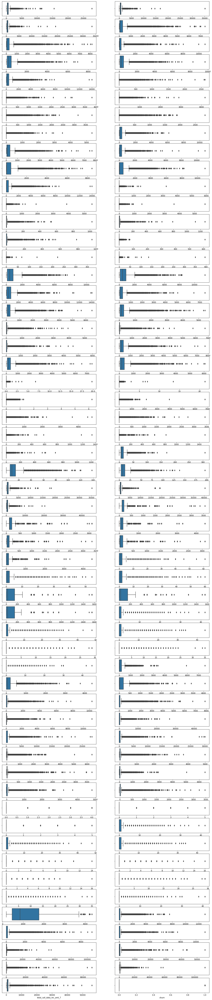

In [66]:
count = 0
plt.figure(figsize=(20,100))
for col in num_vars:
    count = count + 1
    plt.subplot(57,2,count)
    sns.boxplot(high_value_customers[col])
    plt.xlabel(col)
plt.show()

#### Plotting distribution of categorical variables data

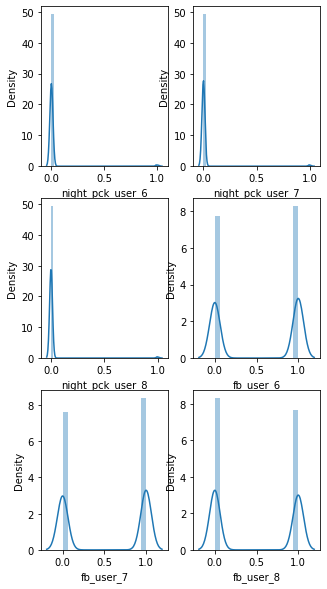

In [67]:
count = 0
plt.figure(figsize=(5,10))
for col in cat_vars:
    count = count + 1
    plt.subplot(3,2,count)
    sns.distplot(high_value_customers[col])
    plt.xlabel(col)
plt.show()
    

From the above plots we can see that most people are not using night packs, however almost half of them are using facebook

#### Seeing the distribution of target variables - Based on which we will choose our appropriate metric

<AxesSubplot:>

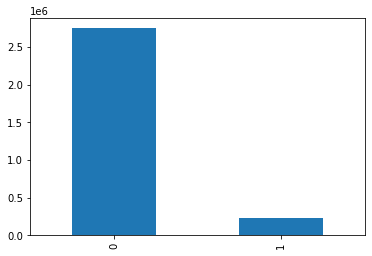

In [68]:
(high_value_customers['churn'].value_counts()*100).plot(kind='bar')

We can see above that ratio of people not churned is much higher than those who have churned. Thus there is severe data imbalance, and we need to focus on finding those who can churn. We want <b> Sensitivity </b> of our model to be high, because we are more concerned with finding out who will churn rather than who will not churn

#### Bivariate analysis

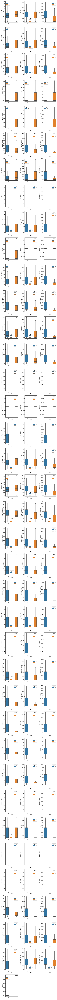

In [69]:
count = 0
plt.figure(figsize=(10,200))
for col in num_vars:
    count = count + 1
    ax = plt.subplot(38,3,count)
    #plt.scatter(x=high_value_customers['churn'], y=high_value_customers[col])
    sns.boxplot(x='churn',y=col,data=high_value_customers,hue='churn', showfliers = False)
    plt.xlabel('churn')
    plt.ylabel(col)
plt.subplots_adjust(wspace = 0.5)        
plt.show()

#### Plotting heatmap to see correlation

<AxesSubplot:>

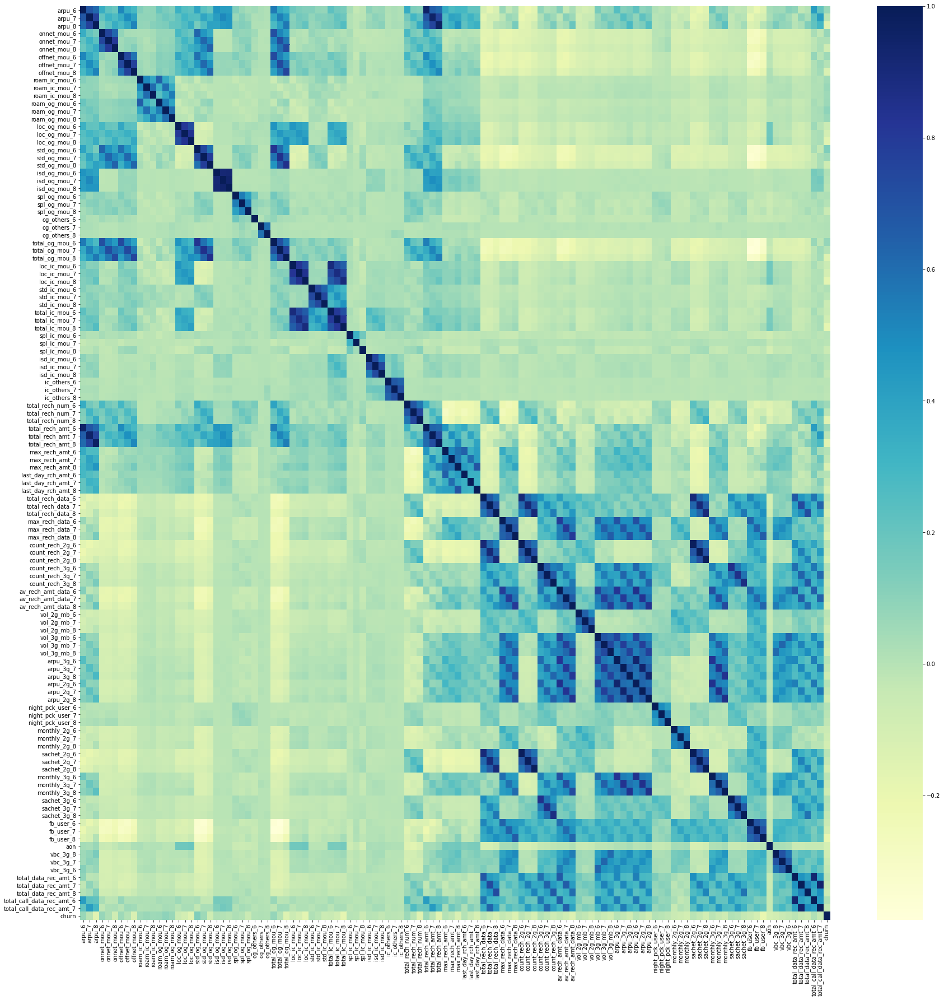

In [70]:
correlationMatrix = high_value_customers.corr()
plt.figure(figsize=(30,30))
sns.heatmap(correlationMatrix, cmap="YlGnBu")

There are some features with high correlation. We can leave them as they are to be dealt later 

#### Feature engineering

Month 6 and 7 are Good phase and month 8 is action phase. Churn prediction is to be done in Action phase. We can merge the columns against months 6 and 7 and rename them with a suffix of 'Good Phase'. And we can rename all month 8 columns with a suffix of 'Action phase'

In [71]:
colPrefix = ['arpu', 'onnet_mou', 'offnet_mou', 'roam_ic_mou', 'roam_og_mou',
'loc_og_mou', 'std_og_mou', 'isd_og_mou', 'spl_og_mou','og_others',
'total_og_mou','loc_ic_mou','std_ic_mou','total_ic_mou','spl_ic_mou',
'isd_ic_mou','ic_others','total_rech_num','total_rech_amt',
'max_rech_amt','last_day_rch_amt','total_rech_data','max_rech_data','count_rech_2g',
'count_rech_3g','av_rech_amt_data','vol_2g_mb','vol_3g_mb','arpu_3g','arpu_2g',
'monthly_2g','sachet_2g','monthly_3g','sachet_3g','vbc_3g','total_data_rec_amt',
'total_call_data_rec_amt']

In [72]:
colPrefix

['arpu',
 'onnet_mou',
 'offnet_mou',
 'roam_ic_mou',
 'roam_og_mou',
 'loc_og_mou',
 'std_og_mou',
 'isd_og_mou',
 'spl_og_mou',
 'og_others',
 'total_og_mou',
 'loc_ic_mou',
 'std_ic_mou',
 'total_ic_mou',
 'spl_ic_mou',
 'isd_ic_mou',
 'ic_others',
 'total_rech_num',
 'total_rech_amt',
 'max_rech_amt',
 'last_day_rch_amt',
 'total_rech_data',
 'max_rech_data',
 'count_rech_2g',
 'count_rech_3g',
 'av_rech_amt_data',
 'vol_2g_mb',
 'vol_3g_mb',
 'arpu_3g',
 'arpu_2g',
 'monthly_2g',
 'sachet_2g',
 'monthly_3g',
 'sachet_3g',
 'vbc_3g',
 'total_data_rec_amt',
 'total_call_data_rec_amt']

In [73]:
for pre in colPrefix:
    colName_6 = pre + '_6'
    colName_7 = pre + '_7'
    colName_8 = pre + '_8'
    
    colName_action = pre + '_action_phase'
    colName_good = pre + '_good_phase'
    
    high_value_customers[colName_good] = (high_value_customers[colName_6] + \
                                          high_value_customers[colName_7])/2
    
    high_value_customers.rename(columns={colName_8:colName_action}, inplace=True)
    high_value_customers.drop({colName_6,colName_7}, axis=1, inplace=True)


In [74]:
high_value_customers.columns

Index(['arpu_action_phase', 'onnet_mou_action_phase',
       'offnet_mou_action_phase', 'roam_ic_mou_action_phase',
       'roam_og_mou_action_phase', 'loc_og_mou_action_phase',
       'std_og_mou_action_phase', 'isd_og_mou_action_phase',
       'spl_og_mou_action_phase', 'og_others_action_phase',
       'total_og_mou_action_phase', 'loc_ic_mou_action_phase',
       'std_ic_mou_action_phase', 'total_ic_mou_action_phase',
       'spl_ic_mou_action_phase', 'isd_ic_mou_action_phase',
       'ic_others_action_phase', 'total_rech_num_action_phase',
       'total_rech_amt_action_phase', 'max_rech_amt_action_phase',
       'last_day_rch_amt_action_phase', 'total_rech_data_action_phase',
       'max_rech_data_action_phase', 'count_rech_2g_action_phase',
       'count_rech_3g_action_phase', 'av_rech_amt_data_action_phase',
       'vol_2g_mb_action_phase', 'vol_3g_mb_action_phase',
       'arpu_3g_action_phase', 'arpu_2g_action_phase', 'night_pck_user_6',
       'night_pck_user_7', 'night_pck_us

## 3. Model Building

####  Train - Test Split

In [75]:
from sklearn.model_selection import train_test_split

In [76]:
y = high_value_customers.churn

X = high_value_customers.drop(columns={'churn'}, axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(20876, 80)
(20876,)
(8948, 80)
(8948,)


#### Feature scaling - Outlier Treatment

In [77]:
from sklearn.preprocessing import StandardScaler

In [78]:
#Get all column names in a variable
num_vars = high_value_customers.columns

In [79]:
high_value_customers.head(5)

,arpu_action_phase,onnet_mou_action_phase,offnet_mou_action_phase,roam_ic_mou_action_phase,roam_og_mou_action_phase,loc_og_mou_action_phase,std_og_mou_action_phase,isd_og_mou_action_phase,spl_og_mou_action_phase,og_others_action_phase,total_og_mou_action_phase,loc_ic_mou_action_phase,std_ic_mou_action_phase,total_ic_mou_action_phase,spl_ic_mou_action_phase,isd_ic_mou_action_phase,ic_others_action_phase,total_rech_num_action_phase,total_rech_amt_action_phase,max_rech_amt_action_phase,last_day_rch_amt_action_phase,total_rech_data_action_phase,max_rech_data_action_phase,count_rech_2g_action_phase,count_rech_3g_action_phase,av_rech_amt_data_action_phase,vol_2g_mb_action_phase,vol_3g_mb_action_phase,arpu_3g_action_phase,arpu_2g_action_phase,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_action_phase,sachet_2g_action_phase,monthly_3g_action_phase,sachet_3g_action_phase,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_action_phase,total_data_rec_amt_action_phase,churn,arpu_good_phase,onnet_mou_good_phase,offnet_mou_good_phase,roam_ic_mou_good_phase,roam_og_mou_good_phase,loc_og_mou_good_phase,std_og_mou_good_phase,isd_og_mou_good_phase,spl_og_mou_good_phase,og_others_good_phase,total_og_mou_good_phase,loc_ic_mou_good_phase,std_ic_mou_good_phase,total_ic_mou_good_phase,spl_ic_mou_good_phase,isd_ic_mou_good_phase,ic_others_good_phase,total_rech_num_good_phase,total_rech_amt_good_phase,max_rech_amt_good_phase,last_day_rch_amt_good_phase,total_rech_data_good_phase,max_rech_data_good_phase,count_rech_2g_good_phase,count_rech_3g_good_phase,av_rech_amt_data_good_phase,vol_2g_mb_good_phase,vol_3g_mb_good_phase,arpu_3g_good_phase,arpu_2g_good_phase,monthly_2g_good_phase,sachet_2g_good_phase,monthly_3g_good_phase,sachet_3g_good_phase,vbc_3g_good_phase,total_data_rec_amt_good_phase,total_call_data_rec_amt_good_phase
0,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,5.44,0.00,5.44,0.0,0.00,0.00,2,252,252,252,1.0,252.0,0.0,1.0,252.0,5.75,109.61,212.17,212.17,0,0,0,0,0,1,0,1,1,1,968,30.40,252.0,1,206.1005,0.00,0.000,0.00,0.000,0.000,0.000,0.000,0.00,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,3.5,307.0,252.0,252.0,1.0,252.0,0.0,1.0,252.0,15.725,117.165,212.170,212.17,0.0,0.0,1.0,0.0,50.600,252.0,559.0
1,3171.480,52.29,325.91,31.64,38.06,255.79,77.84,10.01,6.50,0.0,350.16,188.04,193.94,428.74,0.0,31.59,15.14,7,3638,1580,779,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,802,57.74,0.0,1,1209.5150,56.26,510.295,24.86,18.165,478.035,68.000,0.090,2.25,0.0,548.385,391.555,176.810,592.250,0.105,8.295,15.465,5.0,1185.0,1185.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,19.060,0.0,1185.0
2,137.362,35.08,136.48,0.00,0.00,63.04,98.28,0.00,10.23,0.0,171.56,15.79,0.75,16.54,0.0,0.00,0.00,14,120,30,10,3.0,23.0,3.0,0.0,69.0,0.03,11.94,19.83,0.00,0,0,0,0,3,0,0,0,1,1,315,21.03,207.0,0,435.4720,382.36,87.645,0.00,0.000,333.135,136.870,0.000,0.00,0.0,470.010,52.630,13.545,66.175,0.000,0.000,0.000,20.0,519.0,122.0,25.0,1.0,77.0,1.0,0.0,88.5,178.000,375.475,0.000,0.00,0.5,0.5,0.0,0.0,516.405,177.0,696.0
3,637.760,85.14,983.39,0.00,0.00,129.74,938.79,0.00,0.00,0.0,1068.54,159.11,101.93,261.04,0.0,0.00,0.00,27,718,50,50,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,720,0.00,0.0,0,556.1030,117.26,827.305,0.00,0.000,95.565,848.990,0.000,0.00,0.0,944.565,106.505,62.985,169.490,0.000,0.000,0.000,24.0,640.0,50.0,25.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.000,0.0,640.0
4,366.966,33.58,205.89,0.00,0.00,182.14,39.61,0.00,17.71,0.0,239.48,224.21,57.29,298.33,0.0,3.74,13.06,4,439,179,0,2.0,179.0,0.0,2.0,270.0,0.01,1009.92,197.27,150.67,0,0,0,0,0,1,1,0,1,1,604,40.45,540.0,0,134.1235,49.81,87.385,0.00,0.000,132.795,4.355,0.005,0.05,0.0,137.210,145.520,8.915,171.235,0.000,14.115,2.675,4.0,227.0,89.5,89.5,1.0,89.5,0.0,1.0,178.0,0.240,299.545,153.285,150.89,0.0,0.0,1.0,0.0,25.930,356.0,583.0


In [80]:
#copying all categorical column names in a variable
cat_vars = ['night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 
           'fb_user_6', 'fb_user_7', 'fb_user_8', 'churn']

In [81]:
print(len(num_vars))
print(len(cat_vars))

81
7


In [82]:
num_vars = list(num_vars)

In [83]:
#Retaining only numeric columns in our earlier variable
for x in cat_vars:
    num_vars.remove(x)
    
len(num_vars)

74

In [84]:
#Scaling

scaler = StandardScaler()
X_train[num_vars] = scaler.fit_transform(X_train[num_vars])
X_train.head()

,arpu_action_phase,onnet_mou_action_phase,offnet_mou_action_phase,roam_ic_mou_action_phase,roam_og_mou_action_phase,loc_og_mou_action_phase,std_og_mou_action_phase,isd_og_mou_action_phase,spl_og_mou_action_phase,og_others_action_phase,total_og_mou_action_phase,loc_ic_mou_action_phase,std_ic_mou_action_phase,total_ic_mou_action_phase,spl_ic_mou_action_phase,isd_ic_mou_action_phase,ic_others_action_phase,total_rech_num_action_phase,total_rech_amt_action_phase,max_rech_amt_action_phase,last_day_rch_amt_action_phase,total_rech_data_action_phase,max_rech_data_action_phase,count_rech_2g_action_phase,count_rech_3g_action_phase,av_rech_amt_data_action_phase,vol_2g_mb_action_phase,vol_3g_mb_action_phase,arpu_3g_action_phase,arpu_2g_action_phase,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_action_phase,sachet_2g_action_phase,monthly_3g_action_phase,sachet_3g_action_phase,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_action_phase,total_data_rec_amt_action_phase,arpu_good_phase,onnet_mou_good_phase,offnet_mou_good_phase,roam_ic_mou_good_phase,roam_og_mou_good_phase,loc_og_mou_good_phase,std_og_mou_good_phase,isd_og_mou_good_phase,spl_og_mou_good_phase,og_others_good_phase,total_og_mou_good_phase,loc_ic_mou_good_phase,std_ic_mou_good_phase,total_ic_mou_good_phase,spl_ic_mou_good_phase,isd_ic_mou_good_phase,ic_others_good_phase,total_rech_num_good_phase,total_rech_amt_good_phase,max_rech_amt_good_phase,last_day_rch_amt_good_phase,total_rech_data_good_phase,max_rech_data_good_phase,count_rech_2g_good_phase,count_rech_3g_good_phase,av_rech_amt_data_good_phase,vol_2g_mb_good_phase,vol_3g_mb_good_phase,arpu_3g_good_phase,arpu_2g_good_phase,monthly_2g_good_phase,sachet_2g_good_phase,monthly_3g_good_phase,sachet_3g_good_phase,vbc_3g_good_phase,total_data_rec_amt_good_phase,total_call_data_rec_amt_good_phase
2234,-0.210479,0.814569,-0.449011,-0.166463,-0.185518,-0.282198,0.468346,-0.040961,-0.076623,-0.017362,0.252430,-0.078516,-0.048963,-0.120098,-0.252698,-0.155080,-0.091683,0.107841,-0.203279,-0.178214,-0.443013,-0.542548,-0.662879,-0.476579,-0.319345,-0.628336,-0.334995,-0.380438,-0.367466,-0.382727,0,0,0,-0.381236,-0.415459,-0.338438,-0.183715,0,0,0,-0.932689,-0.398486,-0.275844,-0.044467,1.794439,-0.552397,-0.212269,-0.252225,-0.274809,1.141715,-0.044626,-0.167931,-0.127647,0.856484,0.023534,-0.007051,0.000682,-0.243551,-0.056130,-0.089056,0.024701,-0.073930,-0.394148,-0.840541,-0.653510,-0.772958,-0.551694,-0.387327,-0.754162,-0.415290,-0.435956,-0.420579,-0.439485,-0.464113,-0.472268,-0.388972,-0.224622,-0.427158,-0.399465,-0.389338
13773,-0.690421,-0.485028,-0.684055,-0.162426,-0.144589,-0.636438,-0.492438,-0.040961,-0.179390,-0.017362,-0.769366,-0.723278,-0.279812,-0.757650,-0.252698,-0.155080,-0.091683,0.322596,-0.645283,-0.771886,-0.655568,1.447652,-0.398191,1.484446,0.440041,0.036004,0.314630,0.419466,-0.178880,-0.178124,0,0,1,-0.381236,1.546786,-0.338438,0.697543,1,1,1,-0.643328,-0.153198,0.181315,-1.009713,-0.595405,-0.809389,-0.212269,-0.252225,-0.694238,-0.605090,-0.044626,-0.309648,-0.127647,-0.939192,-0.759612,-0.358211,-0.821021,-0.243551,-0.145489,-0.089056,-0.380148,-0.988473,-0.901757,-0.641761,1.024809,-0.450259,0.925271,0.483335,-0.173142,0.398502,-0.260477,-0.201798,-0.196349,-0.464113,0.996635,-0.388972,0.789810,-0.427158,-0.023567,-0.422193
21641,0.772378,2.558956,-0.267803,-0.166463,-0.185518,0.103266,1.702590,-0.040961,0.185353,-0.017362,1.531916,0.349421,-0.006972,0.258351,-0.252698,-0.155080,-0.091683,0.000463,0.798597,-0.095100,0.265503,-0.542548,-0.662879,-0.476579,-0.319345,-0.628336,-0.334995,-0.380438,-0.367466,-0.382727,0,0,0,-0.381236,-0.415459,-0.338438,-0.183715,0,0,0,-0.036402,-0.398486,-0.275844,1.318706,3.026790,-0.366892,-0.212269,-0.252225,-0.085680,2.110377,-0.044626,-0.067312,0.838948,1.832693,0.117732,-0.135929,0.013187,1.101028,-0.145489,-0.089056,0.603056,1.295609,-0.301855,0.166613,-0.653510,-0.772958,-0.551694,-0.387327,-0.754162,-0.415290,-0.435956,-0.420579,-0.439485,-0.464113,-0.4

#### Model 1 - Logistic Regression

In [85]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(random_state=42, class_weight='balanced')

Feature selection using RFE

In [86]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 20)             # running RFE with 20 variables as output
rfe = rfe.fit(X_train, y_train)

In [87]:
#Columns selected by RFE
col = X_train.columns[rfe.support_]
print(col)

Index(['onnet_mou_action_phase', 'offnet_mou_action_phase',
       'roam_og_mou_action_phase', 'std_og_mou_action_phase',
       'loc_ic_mou_action_phase', 'total_ic_mou_action_phase',
       'spl_ic_mou_action_phase', 'total_rech_num_action_phase',
       'last_day_rch_amt_action_phase', 'total_rech_data_action_phase',
       'fb_user_8', 'arpu_good_phase', 'onnet_mou_good_phase',
       'offnet_mou_good_phase', 'roam_og_mou_good_phase',
       'loc_og_mou_good_phase', 'std_og_mou_good_phase',
       'loc_ic_mou_good_phase', 'total_ic_mou_good_phase',
       'total_rech_data_good_phase'],
      dtype='object')


In [88]:
#Fitting the model
logm1 = logreg.fit(X_train[col], y_train)

#Predicting in train data
y_train_pred = logm1.predict_proba(X_train[col])[:, 1]
y_train_pred

array([0.48490579, 0.26224964, 0.25242816, ..., 0.93068445, 0.04805132,
       0.83839483])

Creating a dataframe with the actual churn flag and the predicted probabilities

In [89]:
y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0,0.484906,0
1,0,0.262250,0
2,0,0.252428,0
3,0,0.160323,0
4,0,0.128153,0


In [90]:
from sklearn import metrics

In [91]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
print(confusion)

[[15628  3568]
 [  305  1375]]


In [92]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8144759532477486


Getting more metrics besides Accurancy

In [93]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [94]:
#Sensitivity
TP / float(TP+FN)

0.8184523809523809

In [95]:
# Let us calculate specificity
TN / float(TN+FP)

0.8141279433215253

Plotting the ROC curve for a proper tradeoff between sensitivity and specificity

In [96]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [97]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Churn, y_train_pred_final.Churn_Prob, drop_intermediate = False )

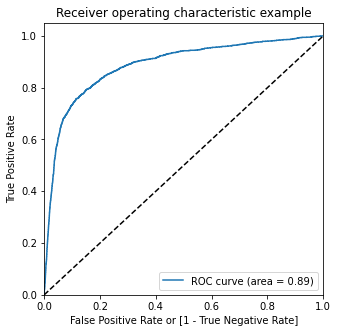

In [98]:
draw_roc(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

Finding optimal cut off point - Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [99]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.484906,0,1,1,1,1,1,0,0,0,0,0
1,0,0.262250,0,1,1,1,0,0,0,0,0,0,0
2,0,0.252428,0,1,1,1,0,0,0,0,0,0,0
3,0,0.160323,0,1,1,0,0,0,0,0,0,0,0
4,0,0.128153,0,1,1,0,0,0,0,0,0,0,0


In [100]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.080475  1.000000  0.000000
0.1   0.1  0.352414  0.967262  0.298604
0.2   0.2  0.510107  0.944643  0.472078
0.3   0.3  0.639634  0.911905  0.615805
0.4   0.4  0.739749  0.875000  0.727912
0.5   0.5  0.814476  0.818452  0.814128
0.6   0.6  0.865396  0.766071  0.874088
0.7   0.7  0.901945  0.698214  0.919775
0.8   0.8  0.926279  0.549405  0.959262
0.9   0.9  0.924459  0.185119  0.989164


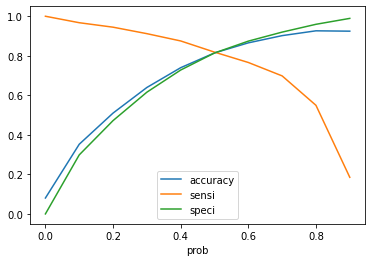

In [101]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

From the curve above, 0.5 looks like the optimum point to take it as a cutoff probability

In [102]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)

y_train_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.484906,0,1,1,1,1,1,0,0,0,0,0,0
1,0,0.262250,0,1,1,1,0,0,0,0,0,0,0,0
2,0,0.252428,0,1,1,1,0,0,0,0,0,0,0,0
3,0,0.160323,0,1,1,0,0,0,0,0,0,0,0,0
4,0,0.128153,0,1,1,0,0,0,0,0,0,0,0,0


In [103]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted)

0.8144759532477486

In [104]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.final_predicted )
confusion2

array([[15628,  3568],
       [  305,  1375]])

In [105]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [106]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8184523809523809

In [107]:
# Let us calculate specificity
TN / float(TN+FP)

0.8141279433215253

Making predictions on test set

In [108]:
X_test[num_vars] = scaler.transform(X_test[num_vars])

In [109]:
y_test_pred = logm1.predict_proba(X_test[col])[:, 1]

#Creating a dataframe with actual churn flag and predicted probabilities
y_test_pred_final = pd.DataFrame({'Churn':y_test.values, 'Churn_Prob':y_test_pred})

y_test_pred_final['final_predicted'] = y_test_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)


accuracy = metrics.accuracy_score(y_test_pred_final.Churn, y_test_pred_final.final_predicted)

confusion2 = metrics.confusion_matrix(y_test_pred_final.Churn, y_test_pred_final.final_predicted )

TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

sensitivity = TP / float(TP+FN)
specificity = TN / float(TN+FP)

print('Metrics for test set [Model 1 - Logistic Regression with RFE]')
print('Accuracy = ', accuracy)
print('Sensitivity = ', sensitivity)
print('Specificity = ', specificity)

Metrics for test set [Model 1 - Logistic Regression with RFE]
Accuracy =  0.8122485471613768
Sensitivity =  0.8230994152046783
Specificity =  0.811350435624395


#### Model 2 - Logistic Regression with PCA

##### Principal Compnent Analysis

In [110]:
X_train.shape

(20876, 80)

In [111]:
from sklearn.decomposition import PCA

In [112]:
pca = PCA(random_state=42)
pca.fit(X_train)

pca.components_

array([[ 3.82327778e-02, -6.43739454e-02, -5.64675605e-02, ...,
         1.69666912e-01,  1.91913796e-01,  1.80163976e-01],
       [ 2.54989511e-01,  1.43129141e-01,  1.91933820e-01, ...,
         4.00791255e-02, -6.08449008e-02,  5.02264933e-02],
       [ 1.28315575e-01,  1.23634388e-01,  1.25331051e-01, ...,
        -7.33211211e-02,  1.67133029e-01,  1.92708986e-01],
       ...,
       [ 0.00000000e+00, -9.43898442e-16, -1.11435536e-15, ...,
         1.68411862e-16,  8.83655513e-03, -9.82308570e-03],
       [-0.00000000e+00, -4.27263135e-15, -4.52643473e-15, ...,
         4.57635102e-17,  1.72933852e-01, -1.92240531e-01],
       [ 0.00000000e+00,  3.44969751e-15,  3.77379996e-15, ...,
         4.84879946e-17,  7.45803021e-02, -8.29065951e-02]])

In [113]:
#Explained variance ratio of each component
pca.explained_variance_ratio_

array([1.64727515e-01, 1.18089698e-01, 8.36961837e-02, 5.59256392e-02,
       4.51564150e-02, 3.63703597e-02, 3.33862394e-02, 2.97140893e-02,
       2.83778924e-02, 2.57294904e-02, 2.43600307e-02, 2.40848725e-02,
       2.15602026e-02, 2.02759951e-02, 1.91602447e-02, 1.68992963e-02,
       1.66174228e-02, 1.51504209e-02, 1.45075199e-02, 1.42305578e-02,
       1.25571161e-02, 1.21312350e-02, 1.16836708e-02, 1.11862339e-02,
       1.06259659e-02, 9.75425090e-03, 8.93268325e-03, 8.51761251e-03,
       8.39620226e-03, 8.27935836e-03, 7.53389193e-03, 6.70257964e-03,
       5.75739204e-03, 5.73832788e-03, 5.30175545e-03, 5.07386626e-03,
       4.32546967e-03, 4.19034941e-03, 3.77558667e-03, 3.65910995e-03,
       3.23512718e-03, 3.18534409e-03, 3.03323583e-03, 2.94408336e-03,
       2.82162907e-03, 2.78598782e-03, 2.30787683e-03, 2.10139546e-03,
       1.94400598e-03, 1.89404190e-03, 1.42671125e-03, 1.31900160e-03,
       1.28148052e-03, 1.14846243e-03, 1.05699962e-03, 1.02684923e-03,
      

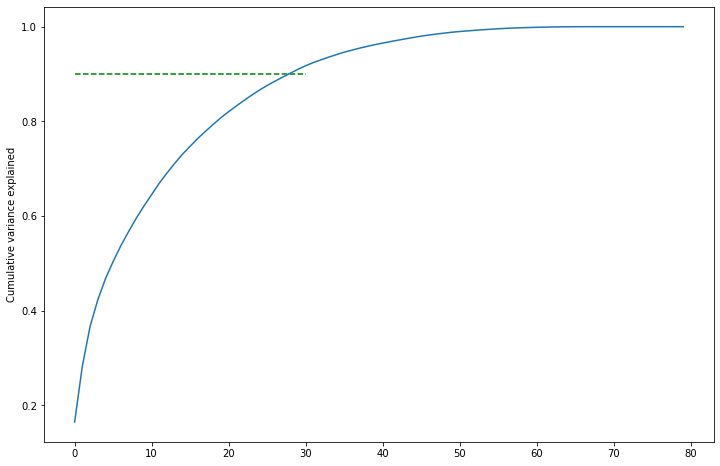

In [114]:
#Making a Scree plot for the explained variance
var_cumu = np.cumsum(pca.explained_variance_ratio_)
fig = plt.figure(figsize=[12,8])
plt.hlines(y=0.90, xmax=30, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

In [115]:
print(pd.Series(np.round(pca.explained_variance_ratio_.cumsum(),4)*100))

0      16.47
1      28.28
2      36.65
3      42.24
4      46.76
5      50.40
6      53.74
7      56.71
8      59.54
9      62.12
10     64.55
11     66.96
12     69.12
13     71.15
14     73.06
15     74.75
16     76.41
17     77.93
18     79.38
19     80.80
20     82.06
21     83.27
22     84.44
23     85.56
24     86.62
25     87.60
26     88.49
27     89.34
28     90.18
29     91.01
30     91.76
31     92.43
32     93.01
33     93.58
34     94.11
35     94.62
36     95.05
37     95.47
38     95.85
39     96.21
40     96.54
41     96.86
42     97.16
43     97.45
44     97.74
45     98.01
46     98.25
47     98.46
48     98.65
49     98.84
50     98.98
51     99.11
52     99.24
53     99.36
54     99.46
55     99.57
56     99.65
57     99.72
58     99.78
59     99.83
60     99.87
61     99.91
62     99.94
63     99.96
64     99.98
65     99.99
66    100.00
67    100.00
68    100.00
69    100.00
70    100.00
71    100.00
72    100.00
73    100.00
74    100.00
75    100.00
76    100.00

We can see above that first 28 Principal components are explaining 90% variance. Which is enough for us, so we can drop the rest and use only these 28, and perform the PCA once more with just these 28.

In [116]:
from sklearn.decomposition import IncrementalPCA

In [117]:
pca_final = IncrementalPCA(n_components=28)
df_train_pca = pca_final.fit_transform(X_train)
df_train_pca.shape

(20876, 28)

In [118]:
corrmat = np.corrcoef(df_train_pca.transpose())
corrmat.shape

(28, 28)

<AxesSubplot:>

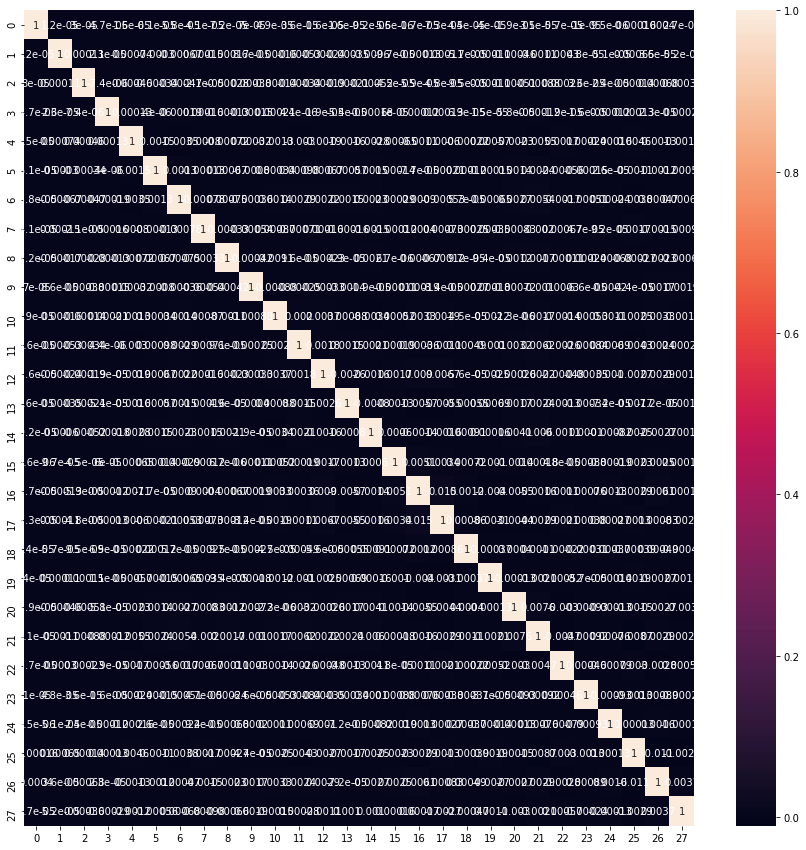

In [119]:
#Plotting heatmap
plt.figure(figsize=[15,15])
sns.heatmap(corrmat, annot=True)

We can see that PCA has removed the collinearity completely

In [120]:
X_test.shape

(8948, 80)

In [121]:
#Performing the transform over the test set - Fitting is done only on train set
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(8948, 28)

##### Making the Logistic Regression model over the Principal Components

In [122]:
#Creating the model and adding the argument to tell the algorithm to handle the data imbalance
logreg = LogisticRegression(random_state=42, class_weight='balanced')
logm2_pca = logreg.fit(df_train_pca, y_train)

In [123]:
# Getting the predicted values on the train set
y_train_pred = logm2_pca.predict_proba(df_train_pca)[:, 1]
y_train_pred

array([0.56223702, 0.29561347, 0.36686493, ..., 0.96116946, 0.04812752,
       0.76304825])

In [124]:
#Creating a dataframe with actual churn flag and predicted probabilities
y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})

# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.562237,1,1,1,1,1,1,0,0,0,0
1,0,0.295613,1,1,1,0,0,0,0,0,0,0
2,0,0.366865,1,1,1,1,0,0,0,0,0,0
3,0,0.141564,1,1,0,0,0,0,0,0,0,0
4,0,0.116532,1,1,0,0,0,0,0,0,0,0


In [125]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.080475  1.000000  0.000000
0.1   0.1  0.340295  0.970833  0.285111
0.2   0.2  0.504982  0.944048  0.466556
0.3   0.3  0.628377  0.914881  0.603303
0.4   0.4  0.722840  0.872619  0.709731
0.5   0.5  0.801974  0.826786  0.799802
0.6   0.6  0.860510  0.755952  0.869660
0.7   0.7  0.898304  0.671429  0.918160
0.8   0.8  0.919525  0.492262  0.956918
0.9   0.9  0.920722  0.175595  0.985935


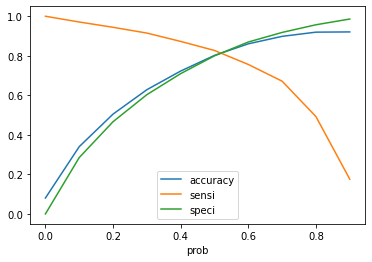

In [126]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

0.5 looks like the optimum point to take it as a cutoff probability

In [127]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)

y_train_pred_final.head()

,Churn,Churn_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.562237,1,1,1,1,1,1,0,0,0,0,1
1,0,0.295613,1,1,1,0,0,0,0,0,0,0,0
2,0,0.366865,1,1,1,1,0,0,0,0,0,0,0
3,0,0.141564,1,1,0,0,0,0,0,0,0,0,0
4,0,0.116532,1,1,0,0,0,0,0,0,0,0,0


In [128]:
accuracy = metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted)

confusion2 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.final_predicted )

TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

sensitivity = TP / float(TP+FN)
specificity = TN / float(TN+FP)

print('Metrics for train set')
print('Accuracy = ', accuracy)
print('Sensitivity = ', sensitivity)
print('Specificity = ', specificity)

Metrics for train set
Accuracy =  0.8019735581529028
Sensitivity =  0.8267857142857142
Specificity =  0.7998020420921025


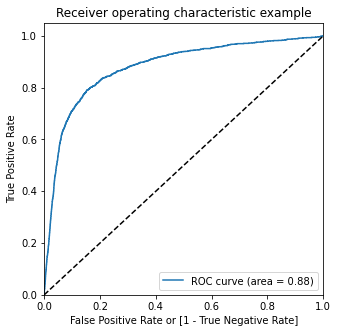

In [129]:
# Plot ROC curve
draw_roc(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

We can see that this is a pretty good ROC curve

Making predictions on test set

In [130]:
y_test_pred = logm2_pca.predict_proba(df_test_pca)[:, 1]

#Creating a dataframe with actual churn flag and predicted probabilities
y_test_pred_final = pd.DataFrame({'Churn':y_test.values, 'Churn_Prob':y_test_pred})

y_test_pred_final['final_predicted'] = y_test_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.6 else 0)


accuracy = metrics.accuracy_score(y_test_pred_final.Churn, y_test_pred_final.final_predicted)

confusion2 = metrics.confusion_matrix(y_test_pred_final.Churn, y_test_pred_final.final_predicted )

TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

sensitivity = TP / float(TP+FN)
specificity = TN / float(TN+FP)

print('Metrics for test set [Model 2 - Logistic Regression with PCA]')
print('Accuracy = ', accuracy)
print('Sensitivity = ', sensitivity)
print('Specificity = ', specificity)

Metrics for test set [Model 2 - Logistic Regression with PCA]
Accuracy =  0.8614215467143496
Sensitivity =  0.7733918128654971
Specificity =  0.8687076476282671


#### Model 3 - Decision Tree with Hyperparameter tuning

In [131]:
from sklearn.tree import DecisionTreeClassifier

In [132]:
#Fitting the Decision tree with default parameters
dt = DecisionTreeClassifier(class_weight='balanced', max_depth=3)
dt.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=3)

In [133]:
#Making the prediction on train and test set
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

In [134]:
#Metrics for train set prediction
accuracy = metrics.accuracy_score(y_train, y_train_pred)

confusion2 = metrics.confusion_matrix(y_train, y_train_pred)

TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

sensitivity = TP / float(TP+FN)
specificity = TN / float(TN+FP)

print('Metrics for train set [Model 3 - Decision Tree [Without HyperP tuning]')
print('Accuracy = ', accuracy)
print('Sensitivity = ', sensitivity)
print('Specificity = ', specificity)

Metrics for train set [Model 3 - Decision Tree [Without HyperP tuning]
Accuracy =  0.8587852078942326
Sensitivity =  0.7773809523809524
Specificity =  0.8659095644926026


In [135]:
#Metrics for test set prediction
accuracy = metrics.accuracy_score(y_test, y_test_pred)

confusion2 = metrics.confusion_matrix(y_test, y_test_pred)

TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

sensitivity = TP / float(TP+FN)
specificity = TN / float(TN+FP)

print('Metrics for test set [Model 3 - Decision Tree [Without HyperP tuning]')
print('Accuracy = ', accuracy)
print('Sensitivity = ', sensitivity)
print('Specificity = ', specificity)

Metrics for test set [Model 3 - Decision Tree [Without HyperP tuning]
Accuracy =  0.8520339740724184
Sensitivity =  0.8128654970760234
Specificity =  0.8552758954501453


Tuning the hyperparameters
1. Tune max_depth
2. Tune min_samples_leaf
3. Tune min_samples_split
4. Final run with optimal parameters

In [136]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(1, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',
                               criterion = "gini", 
                               random_state = 100)

# fit tree on training data - Choosing precision as score because we want to 
#focus on getting the True Positives right
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="precision",return_train_score=True)
tree.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              random_state=100),
             param_grid={'max_depth': range(1, 20)}, return_train_score=True,
             scoring='precision')

In [137]:
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.121002,0.009919,0.008650,0.000464,1,{'max_depth': 1},0.330124,0.314741,0.296053,0.318489,0.296489,0.311179,0.013188,18,0.306548,0.310207,0.315032,0.309302,0.314889,0.311196,0.003302
1,0.226309,0.012164,0.008859,0.000281,2,{'max_depth': 2},0.265327,0.253189,0.261270,0.263467,0.262475,0.261146,0.004194,19,0.260761,0.262975,0.263446,0.260373,0.262722,0.262056,0.001243
2,0.319909,0.016877,0.009278,0.001495,3,{'max_depth': 3},0.374090,0.326531,0.350072,0.339426,0.356841,0.349392,0.016049,12,0.361429,0.339372,0.365819,0.335149,0.363929,0.353139,0.013108
3,0.404595,0.012432,0.008515,0.000271,4,{'max_depth': 4},0.275964,0.337802,0.288398,0.307134,0.379471,0.317754,0.037234,16,0.274892,0.357916,0.314302,0.325044,0.396863,0.333803,0.041196
4,0.488741,0.016770,0.008455,0.000279,5,{'max_depth': 5},0.335812,0.321608,0.370262,0.331613,0.320423,0.335944,0.018127,14,0.349476,0.350046,0.417910,0.351679,0.330360,0.359894,0.030037


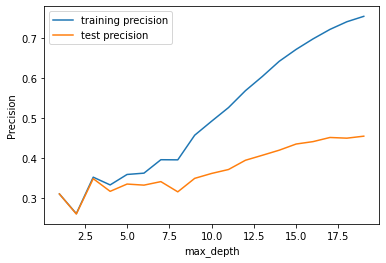

In [138]:
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training precision")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test precision")
plt.xlabel("max_depth")
plt.ylabel("Precision")
plt.legend()
plt.show()

Max depth of around 3 looks like a good value 

2. Tune minimum sample leaf

In [139]:
# GridSearchCV to find optimal min_samples_leaf
n_folds = 5
parameters = {'min_samples_leaf': range(5, 400, 20)}
dtree = DecisionTreeClassifier(class_weight='balanced',
                               criterion = "gini", 
                               random_state = 100)
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="precision",return_train_score=True)
tree.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              random_state=100),
             param_grid={'min_samples_leaf': range(5, 400, 20)},
             return_train_score=True, scoring='precision')

In [140]:
# Scores
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.250689,0.090886,0.010445,0.000591,5,{'min_samples_leaf': 5},0.403670,0.382189,0.358792,0.377289,0.403255,0.385039,0.016947,1,0.609248,0.610909,0.605405,0.608420,0.616797,0.610156,0.003770
1,1.095223,0.017346,0.010192,0.000223,25,{'min_samples_leaf': 25},0.325758,0.294050,0.311656,0.355932,0.313653,0.320210,0.020530,2,0.401322,0.377674,0.396098,0.421780,0.404134,0.400201,0.014189
2,1.024425,0.024841,0.010040,0.000383,45,{'min_samples_leaf': 45},0.295280,0.285092,0.275239,0.293028,0.295271,0.288782,0.007738,17,0.338796,0.342255,0.342402,0.343006,0.357163,0.344724,0.006392
3,1.002196,0.063231,0.011099,0.000619,65,{'min_samples_leaf': 65},0.314286,0.290598,0.260577,0.304054,0.273486,0.288600,0.019577,19,0.341170,0.329944,0.319306,0.331813,0.318992,0.328245,0.008345
4,0.937782,0.045806,0.010782,0.001084,85,{'min_samples_leaf': 85},0.323149,0.316032,0.263969,0.300559,0.294691,0.299680,0.020587,9,0.352627,0.338422,0.311525,0.325705,0.320442,0.329744,0.014379


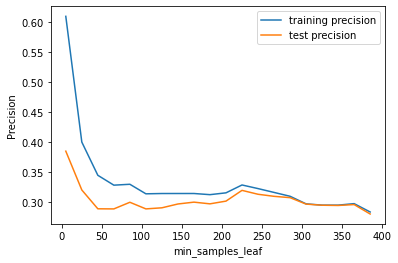

In [141]:
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training precision")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test precision")
plt.xlabel("min_samples_leaf")
plt.ylabel("Precision")
plt.legend()
plt.show()

Starting from around a value of 290, the model looks stable

3. Tune min_samples_split

In [142]:
#GridSearchCV run to find the optimal min_samples_split
n_folds = 5
parameters = {'min_samples_split': range(5, 300, 20)}

dtree = DecisionTreeClassifier(class_weight='balanced',
                               criterion = "gini", 
                               random_state = 100)

tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="precision",return_train_score=True)

tree.fit(X_train, y_train)

scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.490286,0.091046,0.010679,0.000643,5,{'min_samples_split': 5},0.445714,0.434402,0.432665,0.453757,0.435135,0.440335,0.008126,1,0.924983,0.929461,0.929461,0.940518,0.920548,0.928994,0.006643
1,1.402954,0.073192,0.012000,0.002964,25,{'min_samples_split': 25},0.368132,0.343333,0.341328,0.357265,0.359404,0.353893,0.010138,2,0.597583,0.561242,0.600540,0.569486,0.617267,0.589223,0.020770
2,1.982786,0.480730,0.017522,0.005677,45,{'min_samples_split': 45},0.337700,0.301565,0.304348,0.323795,0.318047,0.317091,0.013222,3,0.487823,0.471130,0.488122,0.480232,0.497550,0.484971,0.008835
3,2.484532,0.180324,0.018341,0.002309,65,{'min_samples_split': 65},0.326475,0.284653,0.286096,0.312935,0.302778,0.302587,0.015945,4,0.449196,0.415100,0.430363,0.437124,0.455338,0.437424,0.014197
4,1.915170,0.432884,0.015481,0.004687,85,{'min_samples_split': 85},0.312821,0.279343,0.279503,0.293758,0.295866,0.292258,0.012390,5,0.411321,0.393413,0.410460,0.396364,0.421549,0.406621,0.010386


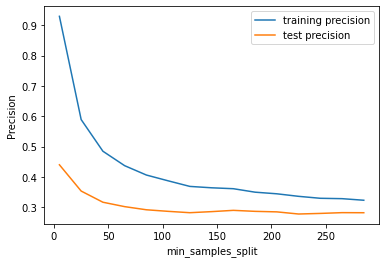

In [143]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training precision")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test precision")
plt.xlabel("min_samples_split")
plt.ylabel("Precision")
plt.legend()
plt.show()

Train and Test precisions do not converge into one point but they do become stable after around 225

4. Running the final Grid search to optimize all hyper parameters at once utilizing the previously found figues as guide to the range we use for parameters now

In [144]:
param_grid = {
    'max_depth': range(3, 9, 2),
    'min_samples_leaf': range(250, 350, 20),
    'min_samples_split': range(200, 300, 20),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

dtree = DecisionTreeClassifier(class_weight='balanced')
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1)

grid_search.fit(X_train,y_train)

cv_results = pd.DataFrame(grid_search.cv_results_)

# printing the optimal accuracy score and hyperparameters
print("Best Precision score = ", grid_search.best_score_)
print(grid_search.best_estimator_)

Fitting 5 folds for each of 150 candidates, totalling 750 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 750 out of 750 | elapsed:  6.9min finished


Best Precision score =  0.866401048477757
DecisionTreeClassifier(class_weight='balanced', max_depth=3,
                       min_samples_leaf=250, min_samples_split=200)


Building the final model using the best parameters found

In [145]:
dtree = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  class_weight='balanced', 
                                   max_depth=3,
                                   min_samples_leaf=250, 
                                   min_samples_split=200)
dtree.fit(X_train, y_train)


DecisionTreeClassifier(class_weight='balanced', max_depth=3,
                       min_samples_leaf=250, min_samples_split=200,
                       random_state=100)

In [146]:
#Collecting importance of feature data in a dataframe to print  
imp_features = pd.DataFrame({'VarName':X_train.columns,
                            'Importance': dtree.feature_importances_})
imp_features.sort_values(by='Importance', ascending=False)

,VarName,Importance
11,loc_ic_mou_action_phase,0.680216
4,roam_og_mou_action_phase,0.107641
42,total_data_rec_amt_action_phase,0.084171
18,total_rech_amt_action_phase,0.050253
13,total_ic_mou_action_phase,0.043024
49,std_og_mou_good_phase,0.034695
58,isd_ic_mou_good_phase,0.000000
57,spl_ic_mou_good_phase,0.000000
56,total_ic_mou_good_phase,0.000000
55,std_ic_mou_good_phase,0.000000


Making the prediction of test set

In [147]:
y_test_pred = dtree.predict(X_test)

#Metrics for test set prediction
accuracy = metrics.accuracy_score(y_test, y_test_pred)

confusion2 = metrics.confusion_matrix(y_test, y_test_pred)

TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

sensitivity = TP / float(TP+FN)
specificity = TN / float(TN+FP)

print('Metrics for test set [Model 3 - Decision Tree with Hyperparameter tuning]')
print('Accuracy = ', accuracy)
print('Sensitivity = ', sensitivity)
print('Specificity = ', specificity)

Metrics for test set [Model 3 - Decision Tree with Hyperparameter tuning]
Accuracy =  0.8520339740724184
Sensitivity =  0.8128654970760234
Specificity =  0.8552758954501453


#### Model 4 - Decision Tree with ADA boosting

In [148]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.preprocessing import LabelEncoder


In [149]:
#Creating base estimator which is a weak learner
shallow_tree = DecisionTreeClassifier(max_depth=2, random_state = 100, class_weight='balanced')

#Fitting the model
shallow_tree.fit(X_train, y_train)

#Making prediction on train set
y_train_pred = shallow_tree.predict(X_train)

#Metrics for train set prediction
accuracy = metrics.accuracy_score(y_train, y_train_pred)

confusion2 = metrics.confusion_matrix(y_train, y_train_pred)

TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

sensitivity = TP / float(TP+FN)
specificity = TN / float(TN+FP)

print('Metrics for train set [Model 4 - ADA boosting]')
print('Accuracy = ', accuracy)
print('Sensitivity = ', sensitivity)
print('Specificity = ', specificity)

Metrics for train set [Model 4 - ADA boosting]
Accuracy =  0.8049913776585553
Sensitivity =  0.7833333333333333
Specificity =  0.8068868514273807


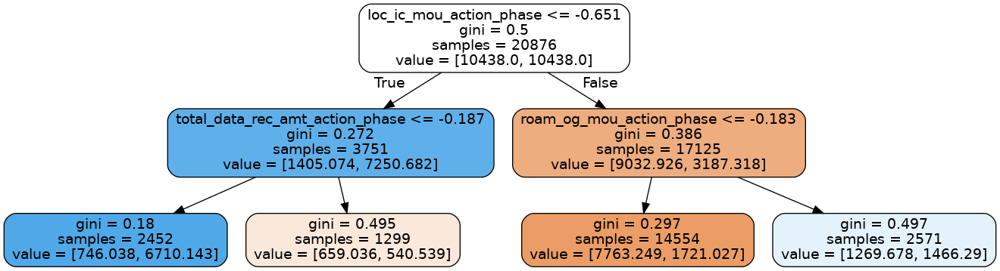

In [152]:
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz

dot_data = StringIO()

export_graphviz(shallow_tree, out_file=dot_data, filled=True, rounded=True,
                feature_names=X_train.columns)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

<b> The above tree is just a weak learner

In [153]:
# Hyperparameter tuning

estimators = list(range(1, 50, 3))

scoreSetSensitivity = []
for n_est in estimators:
    ABClassifier = AdaBoostClassifier(
                                        base_estimator=shallow_tree, 
                                        n_estimators = n_est)
    
    ABClassifier.fit(X_train, y_train)    
    y_test_pred = ABClassifier.predict(X_test)
    confusion2 = metrics.confusion_matrix(y_test, y_test_pred)
    TP = confusion2[1,1] # true positive 
    TN = confusion2[0,0] # true negatives
    FP = confusion2[0,1] # false positives
    FN = confusion2[1,0] # false negatives
    sensitivity = TP / float(TP+FN)
    scoreSetSensitivity.append(sensitivity)

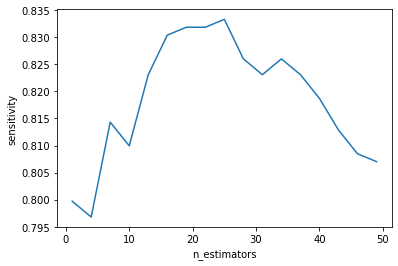

In [154]:
#Plot the scores
plt.plot(estimators, scoreSetSensitivity)
plt.xlabel('n_estimators')
plt.ylabel('sensitivity')
plt.show()

Looks like 27 trees are giving us maximum sensitivity

In [155]:
#Building the final model with 27 trees

ABClassifier = AdaBoostClassifier(
                                    base_estimator=shallow_tree, 
                                    n_estimators = 27)
    
ABClassifier.fit(X_train, y_train)
y_test_pred = ABClassifier.predict(X_test)

#Metrics for test set prediction
accuracy = metrics.accuracy_score(y_test, y_test_pred)

confusion2 = metrics.confusion_matrix(y_test, y_test_pred)

TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

sensitivity = TP / float(TP+FN)
specificity = TN / float(TN+FP)

print('Metrics for test set [Model 4 - Ada boosting with Hyperparameter tuning]')
print('Accuracy = ', accuracy)
print('Sensitivity = ', sensitivity)
print('Specificity = ', specificity)

Metrics for test set [Model 4 - Ada boosting with Hyperparameter tuning]
Accuracy =  0.872038444345105
Sensitivity =  0.8289473684210527
Specificity =  0.8756050338818974


In [156]:
#Collecting importance of feature data in a dataframe to print  
imp_features = pd.DataFrame({'VarName':X_train.columns,
                            'Importance': ABClassifier.feature_importances_})
imp_features.sort_values(by='Importance', ascending=False)

,VarName,Importance
11,loc_ic_mou_action_phase,0.105838
1,onnet_mou_action_phase,0.064462
42,total_data_rec_amt_action_phase,0.054501
40,aon,0.053139
13,total_ic_mou_action_phase,0.052340
5,loc_og_mou_action_phase,0.049089
54,loc_ic_mou_good_phase,0.047010
41,vbc_3g_action_phase,0.042567
6,std_og_mou_action_phase,0.042357
14,spl_ic_mou_action_phase,0.034342


#### Model 5 - Random Forest

Building a Random Forest model with maximum depth=10, number of estimators=20 and max features=25

In [157]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(criterion='gini', class_weight='balanced', n_estimators=20, \
                            max_depth=10, max_features=25, random_state=42, oob_score=True)

rf.fit(X_train, y_train)
rf.oob_score_

0.9248419237401801

Making the predictions

In [158]:
y_test_pred = rf.predict(X_test)

#Metrics for test set prediction
accuracy = metrics.accuracy_score(y_test, y_test_pred)

confusion3 = metrics.confusion_matrix(y_test, y_test_pred)

TP = confusion3[1,1] # true positive 
TN = confusion3[0,0] # true negatives
FP = confusion3[0,1] # false positives
FN = confusion3[1,0] # false negatives

sensitivity = TP / float(TP+FN)
specificity = TN / float(TN+FP)

print('Metrics for test set [Model 5 - Random Forest]')
print('Accuracy = ', accuracy)
print('Sensitivity = ', sensitivity)
print('Specificity = ', specificity)

Metrics for test set [Model 5 - Random Forest]
Accuracy =  0.9387572641931158
Sensitivity =  0.7178362573099415
Specificity =  0.9570425943852856


In [159]:
from sklearn.metrics import plot_roc_curve

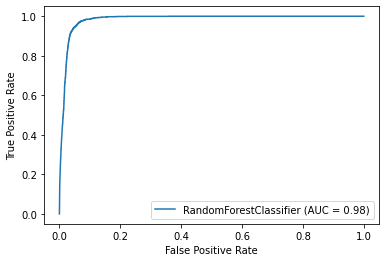

In [160]:
plot_roc_curve(rf, X_train, y_train)
plt.show()

Hyper-parameter tuning for the Random Forest

In [161]:
rf = RandomForestClassifier(criterion='gini', class_weight='balanced', random_state=42, n_jobs=-1)

In [162]:
params = {
    'max_depth': [3,5,10,15,20],
    'min_samples_leaf': [10,20,50],
    'n_estimators': [10, 25, 50],
    'criterion': ["entropy", "gini"]
}

grid_search = GridSearchCV(estimator=rf,
                           param_grid=params,
                           cv = 4,
                           n_jobs=-1, verbose=1, scoring="precision")

grid_search.fit(X_train,y_train)

cv_results = pd.DataFrame(grid_search.cv_results_)

# printing the optimal accuracy score and hyperparameters
print("Best Precision score = ", grid_search.best_score_)
print(grid_search.best_estimator_)

Fitting 4 folds for each of 90 candidates, totalling 360 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 360 out of 360 | elapsed: 12.6min finished


Best Precision score =  0.5560864415456369
RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=20, min_samples_leaf=10, n_estimators=50,
                       n_jobs=-1, random_state=42)


Building the random forest again with best found parameters

In [163]:
rf = RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=20, min_samples_leaf=10, n_estimators=50,
                       n_jobs=-1, random_state=42)


rf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=20, min_samples_leaf=10, n_estimators=50,
                       n_jobs=-1, random_state=42)

In [164]:
sample_tree = rf.estimators_[30]
dot_data = StringIO()

export_graphviz(sample_tree, out_file=dot_data, filled=True, rounded=True,
                feature_names=X_train.columns)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.929824 to fit



In [165]:
y_test_pred = rf.predict(X_test)

#Metrics for test set prediction
accuracy = metrics.accuracy_score(y_test, y_test_pred)

confusion4 = metrics.confusion_matrix(y_test, y_test_pred)

TP = confusion4[1,1] # true positive 
TN = confusion4[0,0] # true negatives
FP = confusion4[0,1] # false positives
FN = confusion4[1,0] # false negatives

sensitivity = TP / float(TP+FN)
specificity = TN / float(TN+FP)

print('Metrics for test set [Model 5 - Random Forest with hyperparameter tuning]')
print('Accuracy = ', accuracy)
print('Sensitivity = ', sensitivity)
print('Specificity = ', specificity)

Metrics for test set [Model 5 - Random Forest with hyperparameter tuning]
Accuracy =  0.9356280733124721
Sensitivity =  0.7090643274853801
Specificity =  0.954380445304937


Plotting ROC AUC

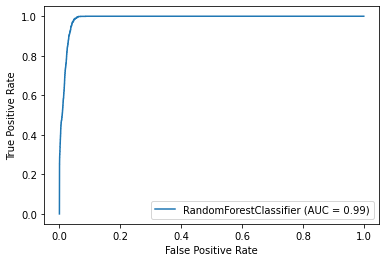

In [166]:
plot_roc_curve(rf, X_train, y_train)
plt.show()

ROC AUC = 0.99

## 4. Model Comparison

Below are the metrics collected for each model we built. We need to focus of getting the True Positives high, so 'Sensitivity' would be a metric which we want to be good.

<b>Metrics for test set [Model 1 - Logistic Regression with RFE] </b>
- Accuracy =  0.8122485471613768
- Sensitivity =  0.8230994152046783
- Specificity =  0.811350435624395

<b>Metrics for test set [Model 2 - Logistic Regression with PCA]</b>
- Accuracy =  0.8614215467143496
- Sensitivity =  0.7733918128654971
- Specificity =  0.8687076476282671

<b>Metrics for test set [Model 3 - Decision Tree with Hyperparameter tuning]</b>
- Accuracy =  0.8520339740724184
- Sensitivity =  0.8128654970760234
- Specificity =  0.8552758954501453

<b>Metrics for test set [Model 4 - Ada boosting with Hyperparameter tuning]</b>
- Accuracy =  0.872038444345105
- Sensitivity =  0.8289473684210527
- Specificity =  0.8756050338818974

<b>Metrics for test set [Model 5 - Random Forest with hyperparameter tuning]</b>
- Accuracy =  0.9356280733124721
- Sensitivity =  0.7090643274853801
- Specificity =  0.954380445304937

<br>
<b>Inference:</b> 
We can see that PCA has not added much value to our model. And the best model for prediction is Ada Boosting with the hyperparameters tuned.

<b>10 Best Predictors as recognized by ADA boost</b>
- loc_ic_mou_action_phase	0.105838
- onnet_mou_action_phase	0.064462
- total_data_rec_amt_action_phase	0.054501
- aon	0.053139
- total_ic_mou_action_phase	0.052340
- loc_og_mou_action_phase	0.049089
- loc_ic_mou_good_phase	0.047010
- vbc_3g_action_phase	0.042567
- std_og_mou_action_phase	0.042357
- spl_ic_mou_action_phase	0.034342

### Recommendation to manage customer churn

The management should focus on below features(top 10) to create a strategy to minimize customer churn:
    Action Phase:
    
    1. Local incoming minutes of usage
    2. All kinds of call within the same network
    3. Total data recharge amount
    4. Total incoming minutes of usage
    5. Local outgoing minutes of usage
    6. Volume based cost
    7. STD outgoing minutes of usage
    8. Special incoming minutes of usage
        If the local incoming, outgoing, STD outgoing usage and total recharge amount are reducing in Action phase, 
        offer a a better plan to retain such customers.
    
    9. For how long the customer is using the your services
    10. Local incoming minutes of usage
        If a segment of customers have been with you for a significant time, they may switch to another network for 
        better offer. Offer an equally competitive plan to such segment of customers.

Author  :   _Danish Ansari_

Demonstration of:

    - Logistic regression
    - Decision tree
    - Ada boosting
    - Random Forest
    - PCA (Performed to support Logistic regression)
    - RFE (Performed to support Logistic regression)